# DELORO Yonatan

# Machine Learning et applications
# TP2 - Estimation de densité, K plus proches voisins

Pour le samedi 15 avril 2017


In [27]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import math
import pdb

plt.rcParams['figure.figsize'][0] = 12

# 1. Données : vélib

In [28]:
fname="velib-enpc.npz"
with  np.load(fname) as obj:
    # Dictionnaire des informations des stations idvelib->(nom,adresse,x,y,nbre attaches,long,lat)
    stations = dict(obj['stations'].tolist())
    # Correspondance idvelib->ligne matrice
    stations_idx = dict(obj['stations_idx'].tolist())
    # Correspondance ligne matrice->idvelib
    idx_stations = dict(obj['idx_stations'].tolist())
    # Matrice du nombre de velos dispo par station par minute
    histo = obj['histo']

parismap = mpimg.imread("paris.jpg")

# Permet d'afficher la carte de Paris
def show_map():
    plt.imshow(parismap,extent=[0,1,0,1],aspect=0.6)

geo_data = np.array([ [x[2],x[3],x[4]] for x in stations.values()])

# 2. Estimation de densité

# 2.1. Histogramme

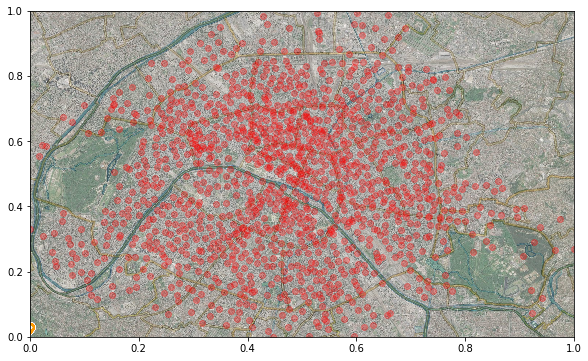

In [39]:
def question_21():
    plt.figure(figsize=(10,10*0.6))
    plt.scatter(geo_data[:,0],geo_data[:,1],alpha=0.3,color="red") #Affichage des stations
    show_map() #Affichage de la carte
    plt.show()

question_21()

# Question 2.1 
A première vue, la densité des stations Vélib apparait donc d'autant plus importante que l'on se rapproche du centre de Paris, mais elle augmente assez progressivement de couronne en couronne (gradient faible).

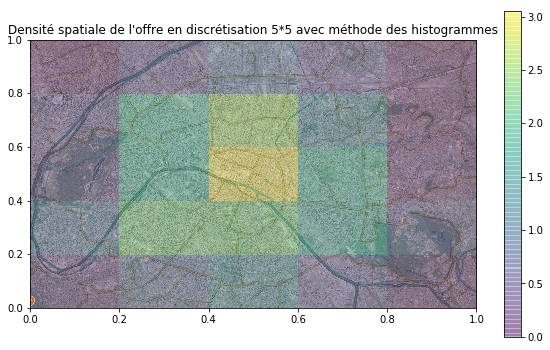

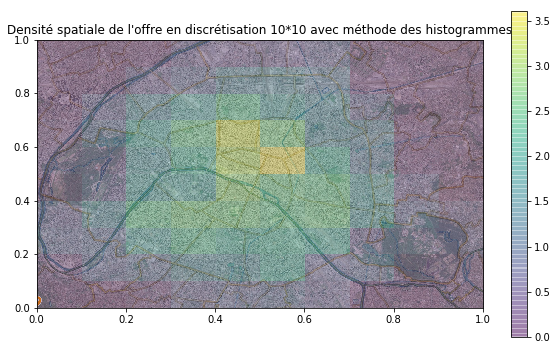

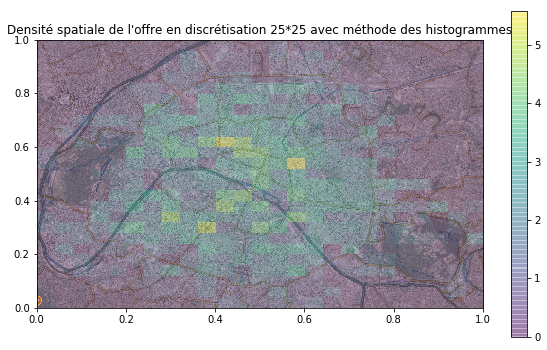

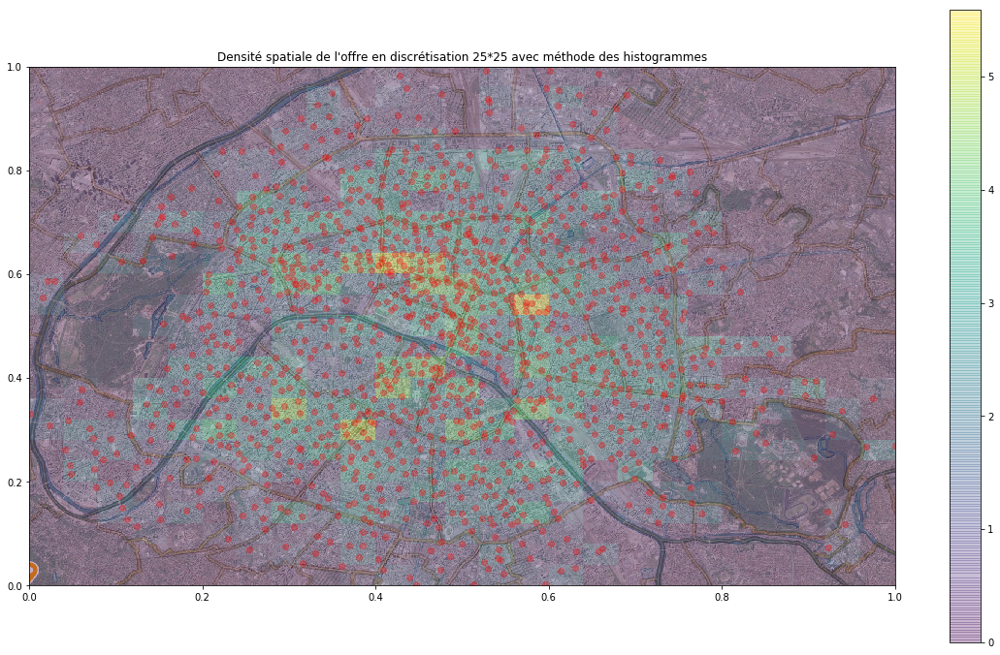

In [30]:
def question_22(nb_steps,affiche):
    #Affiche la densité spatiale de l'offre vélib théorique avec une discrétisation nb_steps*nb_steps
    #grâce à la méthode des histogrammes
    #"affiche"="True" si on veut afficher les stations vélib
    STEPS = 1/nb_steps #STEPS est correspond la longueur du pas
    histo_densite= np.zeros((nb_steps,nb_steps))
    N=np.shape(geo_data)[0] #nombre de stations Vélib
    nb_velos=0  #nombre total de vélos
    for i in range(N):  #on affecte chaque station à la cellule correspondante
        x_cell=int(geo_data[i,0]/STEPS)
        y_cell=int(geo_data[i,1]/STEPS)
        if x_cell==nb_steps: 
            x_cell-=1;
        if y_cell==nb_steps:
            y_cell-=1;
        nb_velos+=geo_data[i,2]
        histo_densite[x_cell,y_cell]+=geo_data[i,2]
    histo_densite=histo_densite/(STEPS*STEPS*nb_velos)
    #on divise par le volume d'une cellule pour avoir une densité (non une probabilité)
    #print(np.sum(histo_densite))
    
    if not affiche:
        plt.figure(figsize=(10,10*0.6))
    if affiche:
        plt.figure(figsize=(20,20*0.6))
        plt.scatter(geo_data[:,0],geo_data[:,1],alpha=0.3,color="red")
        
    show_map()
    
    plt.imshow(histo_densite.T,extent=[0,1,0,1],interpolation='none',alpha=0.3,origin = "lower",aspect=0.6)
    plt.colorbar()
    plt.title("Densité spatiale de l'offre en discrétisation "+str(nb_steps) +"*"+str(nb_steps)+ " avec méthode des histogrammes")
    #plt.scatter(densité spatiale de l'offre vélib théoe avec une discrétisation nb_steps*nb_stepsgeo_data[:,0],geo_data[:,1],alpha=0.3,color="red")
    plt.show()

# Affichage de la densité de l'offre vélib avec la méthode des histogrammes
question_22(5,False)  #discrétisation 5*5
question_22(10,False) #discrétisation 10*10
question_22(25,False) #discrétisation 25*25
question_22(25,True) #discrétisation 25*25 avec affichage stations vélibs

# Question 2.2

En affichant la densité spatiale de l'offre vélib théorique avec une discrétisation (10,10), on remarque qu'elle décroit grossièrement du centre vers la périphérie, une fois et demi à deux fois plus importante au centre que sur les arrondissements périphériques. Aussi, il existe des inégalités au sein des couronnes : au centre de Paris, l'offre est nettement plus prononcée dans 2 quadrans sur 4 ; aussi pour les arrondissements périphériques, l'offre est plus importante au sud, et plus spécifiquement au sud-Est, ainsi qu'au Nord-centre. La discrétisation (5,5) permet de confirmer schématiquement ces grandes tendances. 

Avec la discrétisation (25,25), on doit modifier la conjecture que nous avions émise aux niveaux plus grossiers : on observe en effet qu'au niveau très local, il n'y a pas de si grandes inégalités d'offre entre le centre et la périphérie, sinon plutôt l'existence de quelques zones au centre et au Sud-Est qui concentrent l'offre, et qui expliquaient donc les fortes densités globales de ces régions observées avec les discrétisations (5,5) et (10,10).

Enfin l'offre théorique coincide avec la densité de stations vélib à un niveau grossier (5,5) (centre/périphéries), voire même à un niveau de discrétisation (10,10) , la taille des stations semble donc assez uniforme à cette échelle.
Toutefois, en affichant la densité de l'offre à un niveau (25,25), on remarque que l'offre ne coincide pas nécessairement avec la densité des stations : certaines zones où l'offre est modeste comportent de nombreuses stations, d'où une certaine hétérogénéité de la taille des stations en fonction de l'offre théorique ; ce qui laisse supposer une couverture à peu près uniforme de Paris en stations Vélib mais avec une adéquation entre la taille de celles-ci et une supposée demande.

# Question 2.3

- Le modèle est composé de deux paramètres, qui sont les pas de discrétisation dans les deux directions x et y. Ce nombre de paramètres augmente donc linéairement en fonction du nombre de dimensions. 

- L'avantage de ce modèle est qu'il est très simple à mettre en oeuvre, et qu'il ne dépend pas d'autres paramètres que ceux nécessaires au grillage de l'espace.

- Cependant, on voit que la méthode des histogrammes est instable par rapport au découpage ou autrement dit au choix des pas de discrétisation. En effet, les conjectures que l'on obtient sur les inégalités de densité de l'offre diffèrent selon le pas choisi : cela est dû principalement au fait que certaines stations concentrant une offre importante donnent leur poids à toute une zone, et que cela n'est donc pas toujours représentatif de l'offre globale de la zone si cette station se situe sur son bord. Or de très nombreuses stations se situent sur les bords des zones définies par le découpage et elles donnent ainsi tout leur poids à une zone ou à l'autre un peu au hasard de ce découpage arbitraire. 

- Pour avoir une densité d'offre plus représentative ou plus stable selon le choix du découpage, il serait donc préférable de pondérer les poids des stations par leurs distances aux centres des zones, ce que propose la méthode des fenêtres de Parzen.


# 2.2 Fenêtres de Parzen

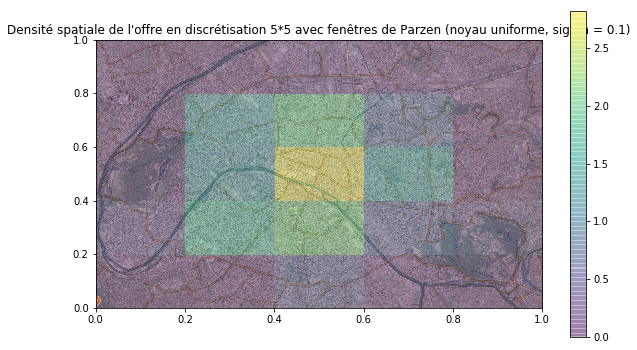

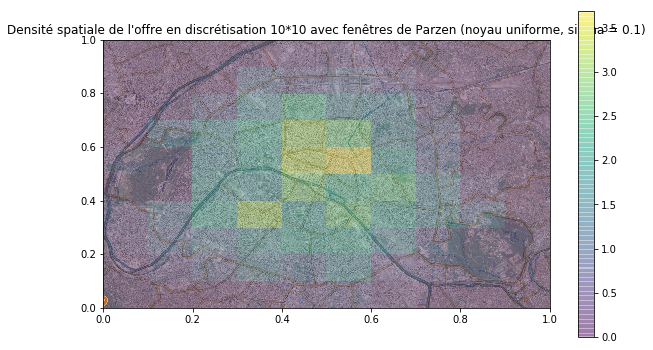

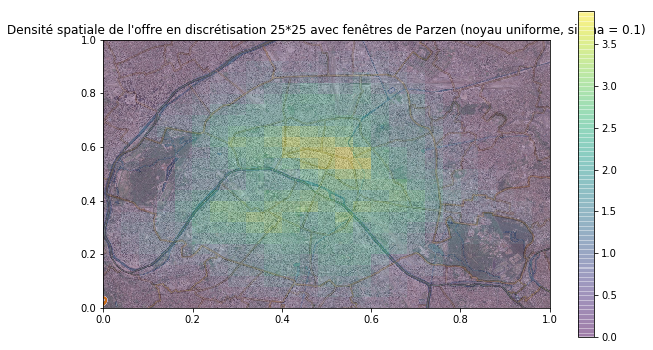

In [31]:
def uni(x,data,sigma):
    #Renvoit la valeur du noyau uniforme pour x la donnée d'une station Vélib et data l'ensemble des données des stations Vélib
    (n,d)=np.shape(data) 
    filtre=(x-data)/sigma
    filtre=np.where(np.abs(filtre)<0.5,1,0)
    kernel=np.reshape(np.min(filtre,axis=1),(n,1))
    return kernel

def gaussian(x,data,sigma):
    #Renvoit la valeur du noyau gaussien pour x la donnée d'une station Vélib et data l'ensemble des données des stations Vélib
    (n,d)=np.shape(data)
    diff=(x-data)/sigma
    diff_norm=np.linalg.norm(diff,axis=1)
    kernel=np.exp(-0.5*pow(diff_norm,2)/pow(2*math.pi,d/2))
    return kernel

def parzen(x,data,weight,sigma,kernel):
    #Calcule l'estimation de la densité au point x pour data l'ensemble des données des stations Vélib
    #en utilisant le noyau kernel 
    #kernel='uni' pour uniforme ou 'gau' pour gaussien
    (n,d)=np.shape(data)
    if ((kernel!="uniforme")and(kernel!="gaussien")):
        print("noyau non reconnu")
    else:
        if (kernel=="uniforme"):
            proba=np.dot(weight,uni(x,data,sigma))
        elif (kernel=="gaussien"):
            proba=np.dot(weight,gaussian(x,data,sigma))
        proba=proba/(pow(sigma,d)*np.sum(weight))
        return proba

def question_26(sigma,meth,nb_steps):
    #Evaluer la densite 2d de l'offre sur une discretisation nb_steps*nb_steps
    #pour un noyau uniforme (meth="uni") ou gaussien (meth="gau"), et pour le paramètre de bande sigma
    
    xx,yy=np.meshgrid(np.linspace(0,1,nb_steps),np.linspace(0,1,nb_steps))
    grid = np.c_[xx.ravel(),yy.ravel()]
    pdf=np.array([parzen(g,geo_data[:,:2],geo_data[:,2],sigma,meth) for g in grid]).reshape((nb_steps,nb_steps))
    #print(np.sum(pdf))
    
    plt.figure(figsize=(10,10*0.6))
    show_map()
    #plt.scatter(geo_data[:,0],geo_data[:,1],alpha=0.3,color="red")
    plt.imshow(pdf,extent=[0,1,0,1],interpolation='none',alpha=0.3,origin="lower",aspect=0.6)
    plt.title("Densité spatiale de l'offre en discrétisation "+str(nb_steps) +"*"+str(nb_steps)+ " avec fenêtres de Parzen (noyau "+meth+", sigma = "+str(sigma)+")")
    plt.colorbar()
    plt.show()

#Test de la stabilité du noyau uniforme vis-à-vis du pas de discrétisation 
question_26(0.1,"uniforme",5) #sigma=0.1,discrétisation 5*5
question_26(0.1,"uniforme",10)
question_26(0.1,"uniforme",25)


# Question 2.6

- a. Stabilité de la méthode des fenêtres de Parzen 

Dans un premier temps, on a souhaité tester la stabilité de la méthode des fenêtres de Parzen vis-à-vis du découpage ou du choix du paramètre de discrétisation.

On affiche ainsi la densité de l'offre théorique de vélibs pour un noyau uniforme et un paramètre de bande $\sigma=1$ à trois niveaux de discrétisation différents : (5,5), (10,10), et (25,25). On remarque en effet que contrairement à la méthode des histogrammes, les densités évoluent beaucoup plus "continûment" d'une échelle à l'autre : c'est flagrant de (10,10) à (25,25), et les valeurs des densités le confirment. 
Ainsi, la méthode des fenêtres de Parzen est plus stable vis-à-vis du découpage que celle des histogrammes, puisqu'elle en élimine les effets de bords.

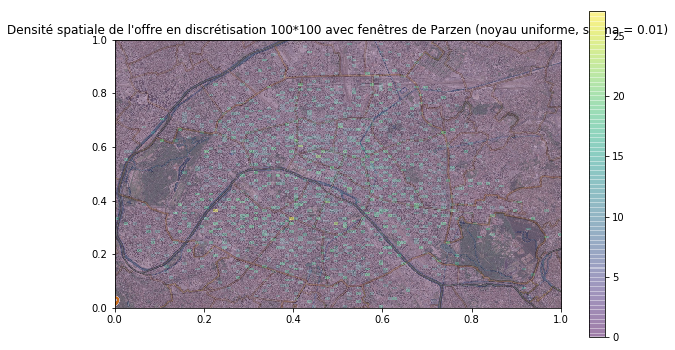

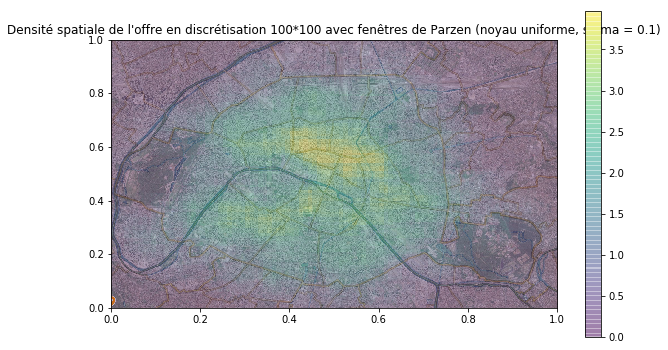

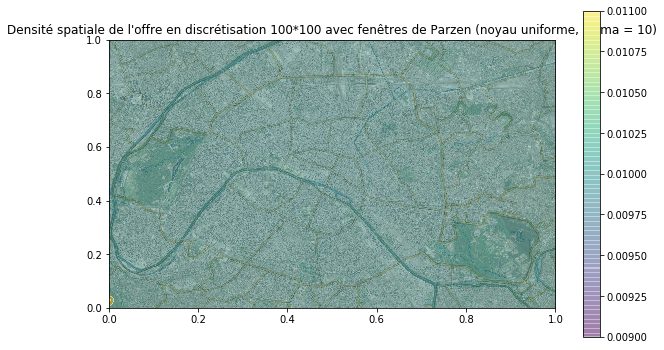

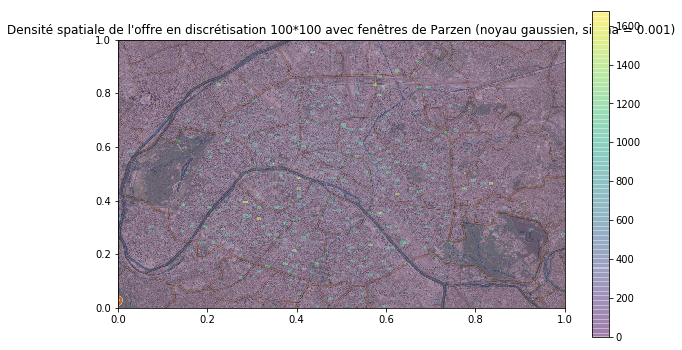

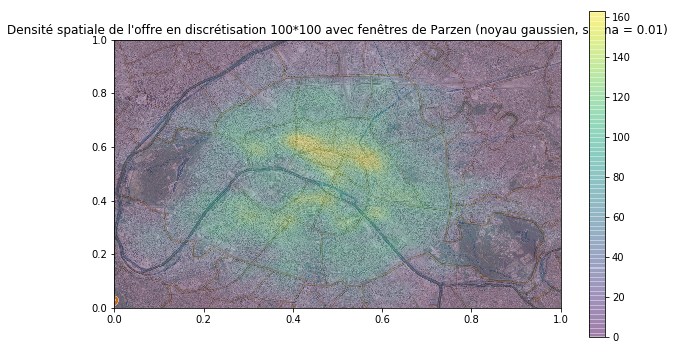

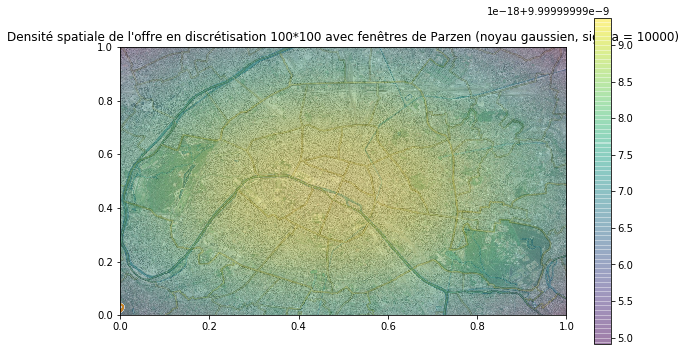

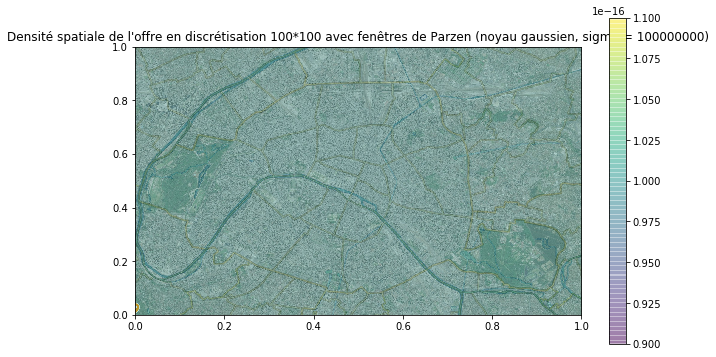

In [32]:
#Comparaison des fenêtres de Parzen selon le noyau uniforme et gaussien,  pour différents paramètres de bande 
nb_steps=100 #nombre
question_26(0.01,"uniforme",nb_steps) #sigma=0.01
question_26(0.1,"uniforme",nb_steps)
question_26(10,"uniforme",nb_steps)

question_26(0.001,"gaussien",nb_steps)
question_26(0.01,"gaussien",nb_steps)
question_26(10000,"gaussien",nb_steps)
question_26(100000000,"gaussien",nb_steps)

# Question 2.6 (suite)

- b. Influence du paramètre de bande $\sigma$ et du choix du noyau sur la fenêtre

On expérimente maintenant les fenêtres de Parzen pour les deux noyaux, uniforme et gaussien, pour différents paramètres de bande $\sigma$ (pas de discrétisation fixé à 0.01)

Pour le noyau uniforme, on observe que :

- quand $\sigma$ tend vers 0, la densité spatiale de l'offre devient nulle dans toutes les cellules de l'espace, sauf dans celles comprenant effectivement une station Vélib en leur centre où elle est alors très importante. En effet, la fenêtre est alors très petite ou même réduite au point central de la zone, si bien que s'il n'y a pas de station exactement en ce point, la densité de toute la zone est nulle, et s'il y en a une, elle est infinie.

- quand $\sigma$ tend vers $+\infty$, la densité spatiale de l'offre est uniformément répartie en tout point. En effet, la fenêtre est si grande, que chaque station de Paris contribue à chaque zone (même si elle en dehors) avec le même poids de 1 !

Pour le noyau gaussien, on observe que :

- quand $\sigma$ tend vers 0, on retrouve la même distribution des "diracs" en les stations que pour le noyau uniforme. Toutefois, il faut diminuer sigma d'un ordre de grandeur de moins que pour le noyau uniforme pour observer notablement cette convergence.

- quand sigma tend vers $+\infty$, la densité spatiale de l'offre tend également vers une répartition uniforme en tout point. En effet, le noyau gaussien vaut alors 1 ($exp(0)$) pour chaque station de Paris, quelque soit sa distance au point central de la zone. Toutefois, il faut aussi augmenter bien plus franchement sigma (de plusieurs ordres de grandeur) que pour le noyau uniforme pour observer cette convergence. Entre temps, quand sigma augmente, on observe ainsi des gaussiennes bidimensionnelles qui ne dépendent que de la position et qui ont des variances de plus en plus élevées

# Question 2.7

- Afin d'évaluer l'estimation, une régression des moindres carrés n'est pas pertinente puisque la densité d'offre réelle en Vélibs à laquelle on peut comparer la prédiction n'est définie qu'aux positions des stations.  La régression donnerait donc pour paramètre optimal de l'estimation $\sigma=0$, soit une densité infinie au niveau des stations, et donc nulle en tous les autres points, ce qui n'est évidemment pas ce que l'on cherche !


- Ainsi on préfère trouver le paramètre $\sigma$ qui maximise la vraisemblance, entendue au sens du produit des densités de l'offre prédite en Vélibs en les positions des différentes stations, estimées avec les fenêtres de Parzen. Bien entendu, si l'on calculait la vraisemblance en apprenant le modèle grâce aux données de toutes les stations Vélib, elle serait encore maximale pour $\sigma=0$, c'est-à-dire pour des Diracs situés aux positions des stations. Par conséquent, on choisira le $\sigma$ qui maximise la vraisemblance calculée sur les prédictions des offres d'un sous-ensemble de stations (ensemble de test) et apprises sur les stations du complémentaire de ce sous-ensemble (ensemble d'entrainement).

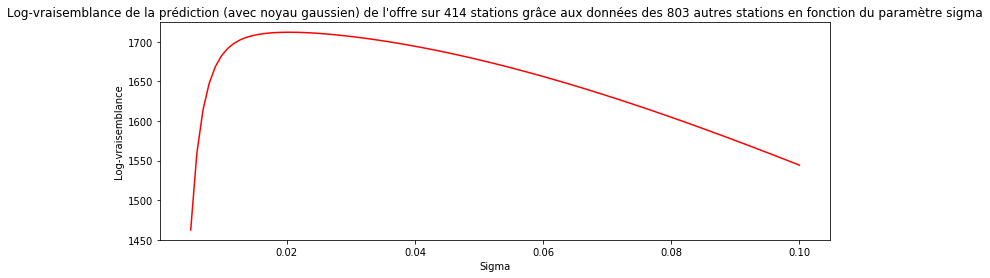

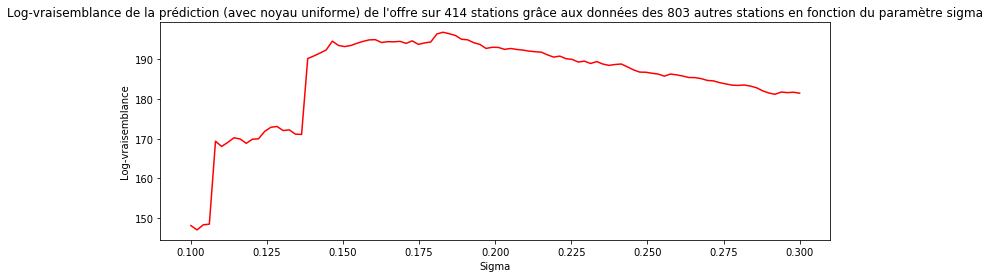

In [33]:
def question_27(meth):
    #meth="gaussien" ou "uniforme" (choix du noyau)
    #Ensemble d'entrainement et ensemble de test
    nb_stations=np.shape(geo_data)[0]
    perm=np.random.permutation(range(nb_stations)) 
    #permutation des stations (pour éviter que les stations considérées soient toutes à proximité)
    nb_train=int(0.66*nb_stations) #nombre de données d'apprentissage
    data_train=perm[:nb_train] #stations que l'on utilise pour les prédictions
    data_test=perm[nb_train:] #stations dont on cherche à prédire l'offre et sur lesquelles on va calculer la vraisemblance
    
    if meth=="gaussien":
        sigma = np.linspace(0.005,0.1,100) #plage de sigma testées
    if meth=="uniforme":
        sigma = np.linspace(0.1,0.3,100) 
    likelihood = []  #log-vraisemblance selon sigma
    
    for s in sigma:
        #on calcule la log-vraisemblance pour éviter les erreurs d'arrondis (produits de beaucoup de probabilités inférieures à 1)
        #on ajoute aussi à la vraisemblance 10^(-10) pour éviter log(0)
        likelihood.append(sum([math.log(parzen(geo_data[g,:2],geo_data[data_train,:2],geo_data[data_train,2],s,meth)+pow(10,-10)) for g in data_test]))
        
    plt.plot(sigma,likelihood,color="red")
    plt.title("Log-vraisemblance de la prédiction (avec noyau "+ str(meth)+") de l'offre sur "+ str(nb_stations-nb_train)+" stations grâce aux données des "+str(nb_train)+" autres stations en fonction du paramètre sigma")
    plt.ylabel("Log-vraisemblance")
    plt.xlabel("Sigma")
    plt.show()    
    
question_27("gaussien")
question_27("uniforme")

# Question 2.7 (suite)

En considérant un ensemble d'apprentissage constitué des 2/3 des stations (tirées aléatoirement avec une permutation pour éviter d'avoir toutes les stations d'une zone contenues dans l'ensemble d'apprentissage) et un ensemble de test constitué du dernier 1/3, station sur lesquelles on calcule donc la vraisemblance, on obtient un maximum de vraisemblance atteint pour $\sigma$ aux alentours de 0.02 pour un noyau gaussien et de 0.2 pour un noyau uniforme.

# Estimateur de Nadaraya-Watson et K plus proches voisins

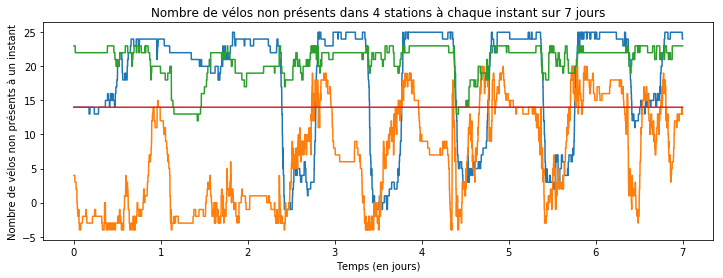

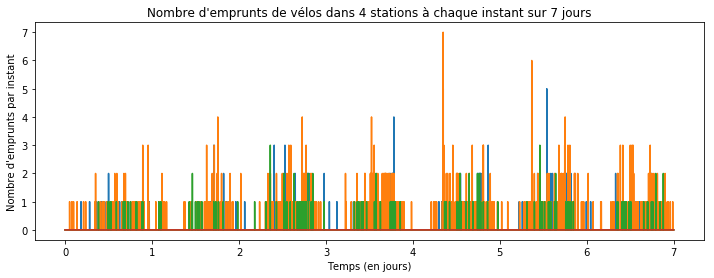

In [34]:
def question_28(affiche):
    #affiche=True : affiche les courbes d'emprunts de Vélib sur une semaine dans 4 stations,
    #affiche=False : retourne la matrice des vélos empruntés
    #à l'instant t par station
    (nb_stations,times)=np.shape(histo)
    
    #Offre de vélos (nombre d'attaches)
    supply=np.reshape(geo_data[:,2],(-1,1))
    supply=np.concatenate([supply for k in range(times)],axis=1)
    supply=np.reshape(np.array(supply),(nb_stations,times))

    #Vélos non présents à l'instant t par station
    nb_days=7
    times=list(range(24*60*nb_days))
    times=[time/(24*60) for time in times]
    take=supply-histo #offre - nombre de vélos disponibles à l'instant t
    
    #Vélos empruntés à l'instant t par station
    nb_take=take[:,1:]-take[:,:-1]
    
    #Pour des soucis de lisibilité on ne considère qu'il y a demande que lorsque cette dernière quantité est
    #positive
    tmp=nb_take.clip(0,np.inf)
    nb_take=tmp

    if affiche:
        plt.plot(times,take[int(nb_stations/5),0:24*60*nb_days])
        plt.plot(times,take[int(2*nb_stations/5),0:24*60*nb_days])
        plt.plot(times,take[int(3*nb_stations/5),0:24*60*nb_days])
        plt.plot(times,take[int(4*nb_stations/5),0:24*60*nb_days])
        plt.title("Nombre de vélos non présents dans 4 stations à chaque instant sur "+str(nb_days)+ " jours")
        plt.ylabel("Nombre de vélos non présents à un instant")
        plt.xlabel("Temps (en jours)")
        plt.show()

        plt.plot(times,nb_take[int(nb_stations/5),0:24*60*nb_days])
        plt.plot(times,nb_take[int(2*nb_stations/5),0:24*60*nb_days])
        plt.plot(times,nb_take[int(3*nb_stations/5),0:24*60*nb_days])
        plt.plot(times,nb_take[int(4*nb_stations/5),0:24*60*nb_days])
        plt.title("Nombre d'emprunts de vélos dans 4 stations à chaque instant sur "+str(nb_days)+ " jours")
        plt.ylabel("Nombre d'emprunts par instant")
        plt.xlabel("Temps (en jours)")
        plt.show()
    else:
        return nb_take

question_28(True)

# Question 2.8. 

Pour des raisons de lisibilité, on ne représente pas la demande algébrique en Vélibs mais le nombre de vélos empruntés à chaque instant (les vélos rendus à la station comptent pour 0).

On observe qu'à part pour une des 4 stations où aucun vélo n'est jamais emprunté, le nombre d'emprunts par minute suit la même dynamique chaque jour ouvré et pour chaque station (emprunts importants le matin et en fin de journée, et quasi-nuls autrement), même si les quantités d'emprunts varient d'une station à l'autre. On observe aussi une différence entre les jours ouvrés et le week-end, que l'on peut ici apparenter aux jours 0 et 1, les vélibs étant empruntés le plus massivement le samedi soir.

Afin de modéliser la demande, on peut donc supposer par exemple, que chaque jour ouvré, les emprunts d'une station suivent la même dynamique et la même dynamique que ceux des stations aux alentours, avec par exemple une quantité de vélos empruntés pondérée par la distance à ces stations aux alentours.

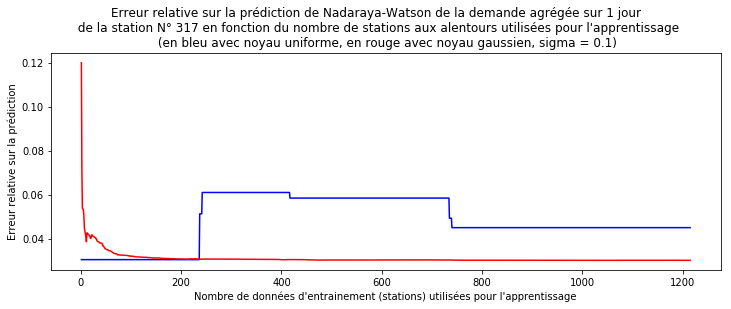

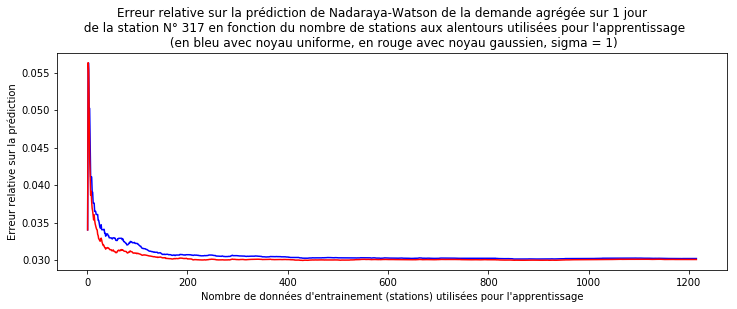

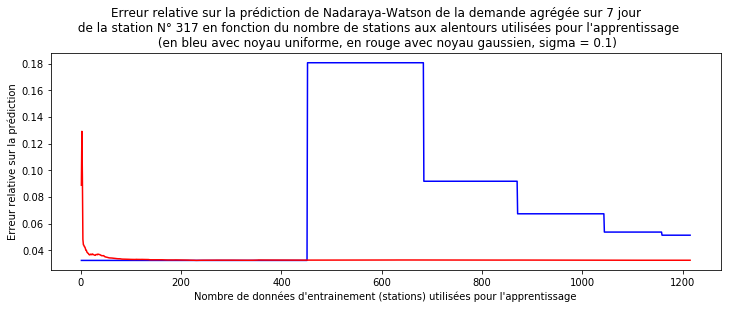

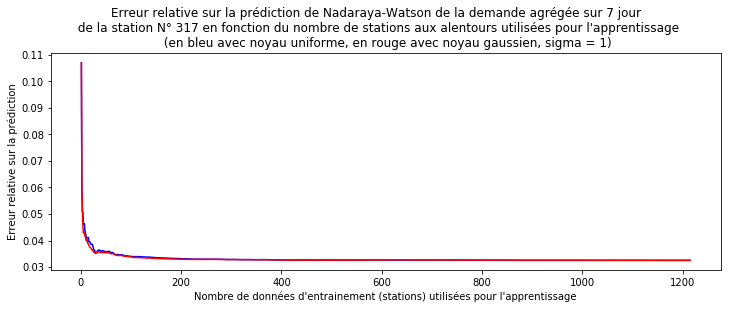

In [35]:
def predict_NadWat(i,t0,dt,kernel,sigma,geo_data_train,take_train):
    #Prédit à l'aide de l'estimateur de Nadaraya-Watson la demande de la station i agrégée sur un nombre "days"
    #de jours à partir de t0 grâce aux demandes sur la même durée des stations aux alentours données par
    #geo_data_train (pour les positions) et par take_train(pour les demandes)
    #kernel="gaussien" ou "uniforme", sigma est toujours le paramètre de bande
    if ((kernel!="uniforme")and(kernel!="gaussien")):
        print("noyau non reconnu")
    else:
        if (kernel=="uniforme"):
            weights=uni(geo_data[i,:2],geo_data_train,sigma) 
            #poids correspondant aux distances entre la station i dont on doit prédire la demande et les autres
            #stations de geo_data_train
        elif (kernel=="gaussien"):
            weights=gaussian(geo_data[i,:2],geo_data_train,sigma)
        Y_predicted=np.dot(np.transpose(weights),take_train)
        #print(np.sum(weights))
        if (np.sum(weights)!=0):
            Y_predicted/=np.sum(weights)
        return Y_predicted

def mse(Y_predicted,Y_observed):
    #Retourne l'erreur des moindres carrés entre Y_predicted et Y_observed
    diff=Y_predicted.flatten()-Y_observed.flatten()
    return np.mean(diff*diff)

def err(Y_predicted,Y_observed):
    #Retourne l'erreur relative de Y_predicted par rapport à Y_observed (tous deux scalaires)
    return abs(Y_predicted-Y_observed)/abs(Y_observed)

def question_29(t0,days,sigma):
    #On veut prédire la demande agrégée sur la durée dt à partir de t0 de la i-ème station
    #grâce aux demandes sur la même durée des autres stations 
    #on veut mesurer l'impact du nombre de stations utilisées pour l'apprentissage

    i=317 #numéro de la station dont la demande est à prédire

    dt=days*24*60 #durée en minutes d'aggregation de la demande
    
    (nb_stations,times)=np.shape(histo)

    #Permutation des stations utilisées pour l'apprentissage 
    #(pour éviter que les stations proches soient lues toutes en même temps)
    perm=np.random.permutation(range(nb_stations))
    index = np.argwhere(perm==i)
    tmp=np.delete(perm,index)
    perm=tmp

    #Demande de la station à prédire
    take=question_28(False) #demande
    demand_observed=take[i,t0:t0+dt]

    #Erreurs des moindres carrées sur la prédiction de la demande avec l'estimateur de Nadaraya-Watson
    #en fonction du nombre de données d'entrainement (stations) utilisées pour l'apprentissage
    error_gauss=[]
    error_uni=[]


    for N in range(1,nb_stations-1): #N nombre de données d'entrainement utilisées
        #Construction de ensemble d'entrainement et de test
        data_train=perm[:N]
        geo_data_train=geo_data[data_train,:2]
        take_train=take[data_train,t0:t0+dt]

        #Prédiction de la demande et calcul de l'erreur relative
        demand_predicted_uni=predict_NadWat(i,t0,dt,"uniforme",sigma,geo_data_train,take_train)
        error_uni.append(mse(demand_predicted_uni,demand_observed))
        #error_uni.append(err(np.sum(demand_predicted_uni),np.sum(demand_observed)))
        demand_predicted_gauss=predict_NadWat(i,t0,dt,"gaussien",sigma,geo_data_train,take_train)
        error_gauss.append(mse(demand_predicted_gauss,demand_observed))
        #error_gauss.append(err(np.sum(demand_predicted_gauss),np.sum(demand_observed)))

    plt.plot(list(range(1,nb_stations-1)),error_uni,color="blue")
    plt.plot(list(range(1,nb_stations-1)),error_gauss,color="red")
    plt.title("Erreur relative sur la prédiction de Nadaraya-Watson de la demande agrégée sur "+str(days)+ " jour \
    \n de la station N° "+str(i)+" en fonction du nombre de stations aux alentours utilisées pour l'apprentissage \
    \n (en bleu avec noyau uniforme, en rouge avec noyau gaussien, sigma = "+str(sigma)+")")
    plt.ylabel("Erreur relative sur la prédiction")
    plt.xlabel("Nombre de données d'entrainement (stations) utilisées pour l'apprentissage")
    plt.show()

        

#Prédictions des demandes agrégées sur un jour/une semaine pour différentes valeurs de sigma
question_29(0,1,0.1) #sur le premier jour, sigma =0.1
question_29(0,1,1)

question_29(0,7,0.1) #sur la première semaine, sigma =0.1
question_29(0,7,1)

# Question 2.9

On calcule donc la prédiction de la demande de la station N°317 agrégée sur 1 jour, puis sur 7 jours, à l'aide de l'estimateur de Nadaraya-Watson appris sur les demandes des autres stations. On observe ainsi l'évolution de l'erreur relative de la prédiction en fonction du nombre de données (stations) utilisées pour construire l'estimateur.

- On observe tout d'abord qu'utiliser plus de la moitié des stations dans l'apprentissage suffit globalement pour avoir un bon estimateur. 
- On remarque également que pour un $\sigma$ petit, l'erreur varie plus brutalement avec le noyau uniforme qu'avec le noyau gaussien avec l'ajout de nouvelles stations au jeu des données d'apprentissage. Ce qui peut s'expliquer par le fait que peu de stations contribuent à l'estimation de la demande (fenêtre petite), d'où la fonction par morceaux que l'on obtient pour le noyau uniforme (poids de 1 pour toutes les stations dans cette fenêtre)
- Aussi lorsque $\sigma$  augmente, les prédictions de l'estimateur de Nadaraya-Watson avec les deux noyaux deviennent de plus en plus proches (on moyennise sur un grand nombre de stations)
- Enfin, l'erreur de prédiction est moins fluctuante lorsque la prédiction se fait en agrégant la demande sur 7 jours plutôt que sur 1 jour, en effet l'aggrégation relativise la contribution à la prédiction d'évènements exceptionnels se produisant en certaines stations certains jours.

Interprétations du choix du paramètre et du noyau
- Le paramètre $\sigma$ peut s'interpréter comme l'étendue spatiale de la zone dont dépend la demande d'une station ou encore la "longueur" des trajets en Vélib : plus $\sigma$ est grand, plus l'estimateur s'appuie sur les demandes de stations éloignées. 

- On aura aussi tendance à choisir un noyau gaussien si l'on croit que la demande d'une station dépend plus de celle des stations dans les  alentours les plus proches que de celles des stations plus lointaines, et un noyau uniforme si on pense mieux approcher la demande d'une station sur un jour en agglomérant les demandes de toutes les stations dans un voisinage.  


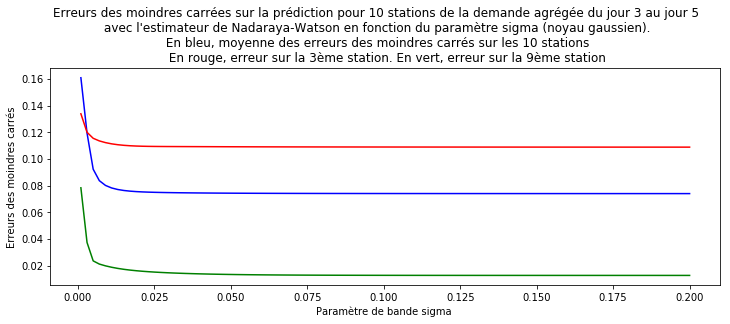

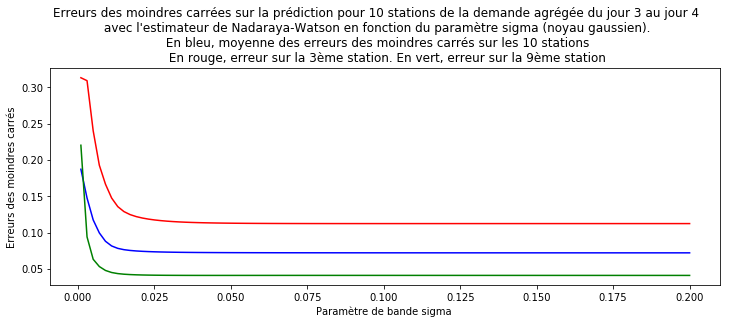

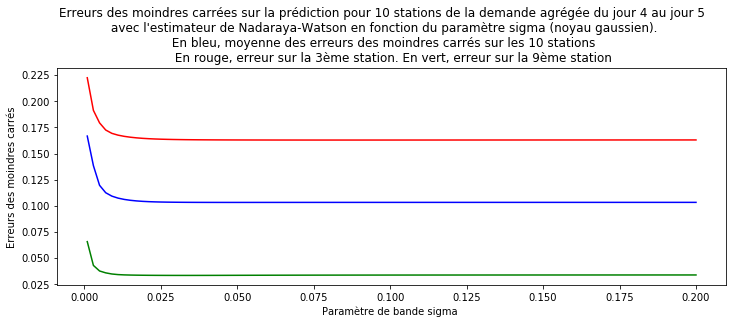

In [36]:
def question_210(i,day0,dayf):
    #Trace l'erreur de prédiction des demandes de 10 stations(dataset) agrégée du jour "day0" au jour "dayf" 
    #apprises grâce aux demandes des autres stations (datatrain) en fonction du paramètre sigma
    (nb_stations,times)=np.shape(histo)
    t0=24*60*day0
    tf=24*60*(dayf+1)

    #Construction de l'ensemble d'entrainement et de test
    perm=np.random.permutation(range(nb_stations))
    data_test=perm[:10]
    data_train=perm[10:]
    geo_data_train=geo_data[data_train,:2]  #données d'entrainement à utiliser
    take=question_28(False) #demande
    take_train=take[data_train,t0:tf]
    #Demandes des stations à prédire
    demand_observed=take[data_test,t0:tf]
    
    #Erreurs des moindres carrées sur la prédiction de la demande agrégée sur une journée pour la station i avec
    #l'estimateur de Nadaraya-Watson en fonction de sigma
    sigmas=np.linspace(0.001,0.2,100) #valeur de sigma testées
    mse_error=[] #erreur des moindres carrées comise sur l'ensemble des prédictions sur les 10 stations en fonction de sigma
    error3=[] #erreur des moindres carrés commise sur la 3ème station du dataset
    error9=[] #erreur des moindres carrés commise sur la 9ème station du dataset
        
    
    for sigma in sigmas:
        demand_predicted=np.array([predict_NadWat(i,t0,tf-t0,"gaussien",sigma,geo_data_train,take_train) for i in data_test])
        mse_error.append(sum([mse(demand_predicted[i,:],demand_observed[i,:]) for i in range(10)])/10)
        
        demand_predicted3=predict_NadWat(data_test[2],t0,tf-t0,"gaussien",sigma,geo_data_train,take_train) 
        error3.append(mse(demand_predicted3,demand_observed[2,:]))

        demand_predicted9=predict_NadWat(data_test[8],t0,tf-t0,"gaussien",sigma,geo_data_train,take_train)
        error9.append(mse(demand_predicted9,demand_observed[8,:]))
        
    plt.plot(sigmas,mse_error,color="blue")
    plt.plot(sigmas,error3,color="red")
    plt.plot(sigmas,error9,color="green")
    plt.title("Erreurs des moindres carrées sur la prédiction pour 10 stations de la demande agrégée du jour "+str(day0)+" au jour "+str(dayf)+" \
    \n avec l'estimateur de Nadaraya-Watson en fonction du paramètre sigma (noyau gaussien). \
    \n En bleu, moyenne des erreurs des moindres carrés sur les 10 stations \
    \n En rouge, erreur sur la 3ème station. En vert, erreur sur la 9ème station")
    plt.ylabel("Erreurs des moindres carrés")
    plt.xlabel("Paramètre de bande sigma ")
    plt.show()

#Prédiction de la demande de la station N°197 
question_210(317,3,5) #du jour 3 au jour 5
question_210(317,3,4) #du jour 3 au jour 4
question_210(317,4,5) #du jour 4 au jour 5

# Question 2.10

Afin de déterminer le meilleur paramètre $\sigma$ par les moindres carrés, il faut découper les données en un ensemble de test et un ensemble d'apprentissage. Pour éviter que les données proches d'une station se situent l'une après l'autre dans la lecture des données, on effectue d'abord une permutation des données puis on constitue notre ensemble de test par les 10 premières données (les autres servant pour l'apprentissage).

On remarque que la plage des $\sigma$ qui minimise la moyenne des erreurs des moindres carrés sur les prédictions des demandes des dix stations du jour 3 au jour 5 n'est pas exactement la même que celle qui minimise l'erreur pour la station 3, qui est encore différente pour la station 9. Aussi, on remarque que cette plage diffère également selon le jour sur lequel on cherche à prédire la demande.

Par conséquent, notre hypothèse de similarité de la dynamique de la demande selon les stations et selon les jours semble trop forte pour l'estimateur de Nadaraya-Watson.

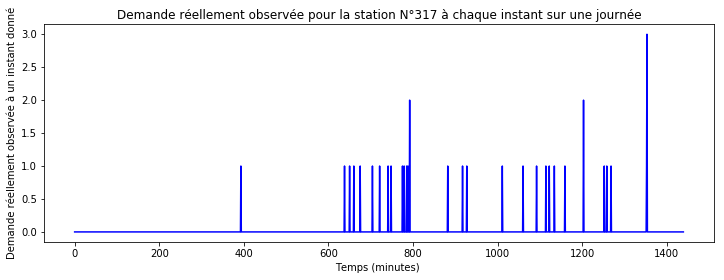

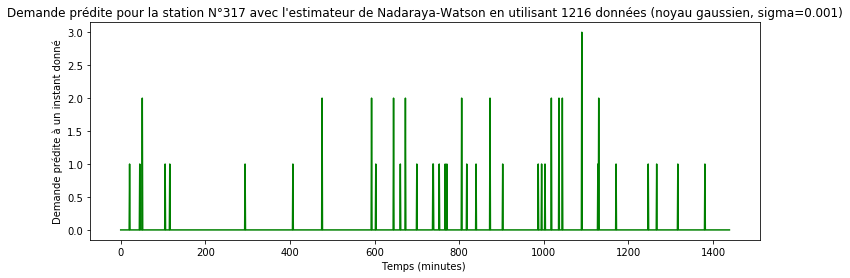

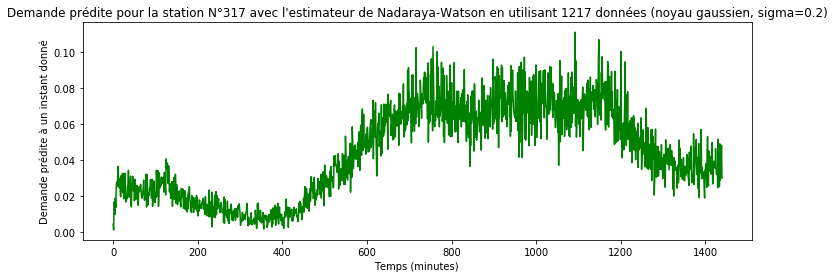

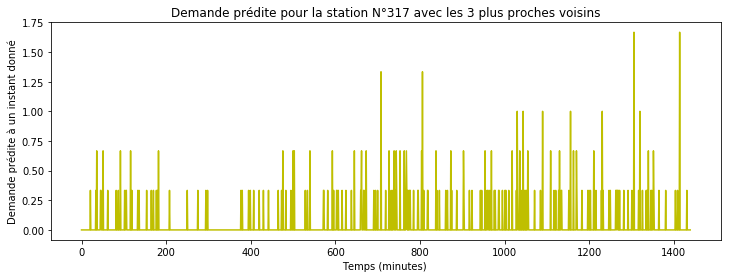

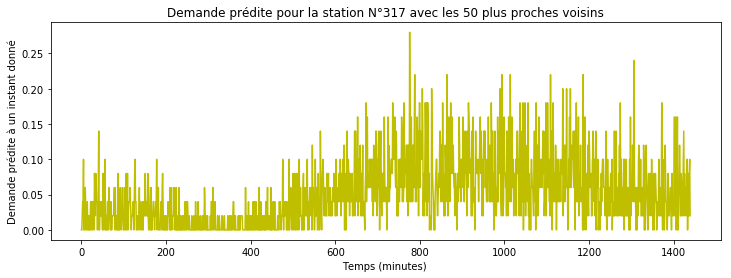

In [37]:
def getkey(item):
    #Clé de tri utile pour ordonner les voisins :
    #distance de la station item à la station i=317 dont on veut prédire la demande (changer i manuellement)
    return np.linalg.norm(geo_data[317,:2]-item[:2])

def predict_demand(i,N,sigma,t0,tf,meth):
    #Trace la demande de la i-ème station de t0 à tf (en minutes)
    #avec l'estimateur de Nadaraya-Watson (meth="nadaraya"), N est alors le nombre de données d'entrainement utilisés, sigma le paramètre de bande
    #ou avec les plus proches voisins (meth="nearest"), avec N le nombre de plus proches voisins, sigma n'a aucun rôle

    (nb_stations,times)=np.shape(histo)
    take=question_28(False) #demande
    if meth=="nadaraya":
        perm=np.random.permutation(range(nb_stations))
        index = np.argwhere(perm==i)
        tmp=np.delete(perm,index)
        data_train_NadWat=tmp[:N]
        geo_data_train_NadWat=geo_data[data_train_NadWat,:2]
        take_train_NadWat=take[data_train_NadWat,t0:tf]

        plt.plot(list(range(t0,tf)),predict_NadWat(i,t0,tf-t0,"gaussien",sigma,geo_data_train_NadWat,take_train_NadWat),color="g")
        plt.ylabel("Demande prédite à un instant donné")
        plt.xlabel("Temps (minutes) ")
        plt.title("Demande prédite pour la station N°"+str(i)+" avec l'estimateur de Nadaraya-Watson en utilisant "+str(N)+" données (noyau gaussien, sigma="+str(sigma)+")")
        plt.show()

    elif meth=="nearest":
        data_train_Nearest=np.array(list(range(nb_stations)))
        index = np.argwhere(data_train_Nearest==i)
        tmp=np.delete(data_train_Nearest,index)
        data_train_Nearest=tmp
        geo_data_train_Nearest=np.reshape(geo_data[data_train_Nearest,0:2],(-1,2))
        take_train_Nearest=np.reshape(np.array(take[data_train_Nearest,t0:tf]),(-1,tf-t0))
        train_NearNeighb=np.concatenate([geo_data_train_Nearest,take_train_Nearest],axis=1)

        #Ordonnancement des stations par leurs distances à la station N°i
        train_NearNeighb=sorted(train_NearNeighb,key = getkey)
        train_NearNeighb=np.vstack(train_NearNeighb)
        
        predicts_NearNeighb=np.mean(train_NearNeighb[:N,2:],axis=0) #les deux premières colonnes correspondent aux positions

        plt.plot(list(range(t0,tf)),predicts_NearNeighb,color="y")
        plt.ylabel("Demande prédite à un instant donné")
        plt.xlabel("Temps (minutes) ")
        plt.title("Demande prédite pour la station N°"+str(i)+" avec les "+str(N)+" plus proches voisins")
        plt.show()

def question_211():
    i=317 #numéro de la station dont on veut prédire la demande
    (nb_stations,times)=np.shape(histo)
    t0=0  #on étudie la demande agrégée sur la première journée
    tf=24*60

    #Tracé de la demande réellement observée
    take=question_28(False)
    demand_observed=take[i,t0:tf]
    plt.plot(list(range(tf)),demand_observed,color="b")
    plt.ylabel("Demande réellement observée à un instant donné")
    plt.xlabel("Temps (minutes) ")
    plt.title("Demande réellement observée pour la station N°"+str(i)+" à chaque instant sur une journée")
    plt.show()

    #Prédiction avec l'estimateur de Nadaraya en utilisant la totalité des stations
    predict_demand(i,nb_stations-1,0.001,t0,tf,"nadaraya") #nb_stations-1 données utilisées (otoutes sauf i!), sigma=0.001
    predict_demand(i,nb_stations,0.2,t0,tf,"nadaraya")

    #Prédiction avec la méthode des plus proches voisins
    predict_demand(i,3,-1,t0,tf,"nearest") #10 plus proches voisins
    predict_demand(i,50,-1,t0,tf,"nearest") #100 plus proches voisins


question_211()

# Question 2.11

On pourrait a priori utiliser le même estimateur de Nadaraya-Watson pour prédire la demande en un point (x,y) quelconque à un instant t. 
Mais dans une région désertique en stations, sachant que l'on n'a pas de données de la demande à cet endroit,on ne pourrait pas effectuer une régression des moindres carrés pour faire la sélection de $\sigma$.

De plus, il serait aussi meilleur de estimer la demande u(x,y,t) non seulement grâce aux données des stations aux alentours à cet instant t mais également aux demandes en ce point (x,y) aux instants précédents (par récurrence) puisqu'il y a dépendance temporelle comme on l'a conjecturé. Ainsi il faudrait calibrer deux paramètres $\sigma$ pour la dépendance spatiale ainsi que pour la dépendance temporelle.

Une alternative à l'estimateur de Nadaraya-Watson est de moyenner les valeurs des k plus proches voisins d'un point.

On représente la demande de la station 317 à chaque instant de la première journée, ainsi que sa prédiction par l'estimateur de Nadaraya-Watson (en utilisant la totalité des données des autres stations, et pour $\sigma=0.001$ et $\sigma=0.2$) et par la méthode des k-plus proches voisins (en utilisant 3 et 50 voisins respectivement).

On observe que $\sigma$ dans l'estimateur de Nadaraya joue un rôle semblable à celui du nombre de plus proches voisins, ce qui est assez intuitif (plus la fenêtre est petite, plus on prend en compte un faible nombre de stations, les plus proches, dans l'estimation ; seule la pondération change entre les deux méthodes)
- Quand $\sigma=0.001$ ou quand on ne considère que les 3 voisins plus proches, on arrive à approcher raisonnablement la demande réellement observée. 
- Quand $\sigma=0.2$ ou qu'on considère les 100 plus proches voisins, on observe que la demande prédite est 10 fois plus petite que l'observée, ce que l'on peut expliquer par le fait que les pics de demandes n'interviennent pas exactement au même moment dans chaque station et que moyenner un pic important avec une quantité de demandes nulles atténue fortement l'intensité du pic à cet instant.


# 3. K-means 

Compositions des clusters : 
Nombre de stations appartenant au cluster  0  :  341
Nombre de stations appartenant au cluster  1  :  11
Nombre de stations appartenant au cluster  2  :  2
Nombre de stations appartenant au cluster  3  :  3
Nombre de stations appartenant au cluster  4  :  1
Nombre de stations appartenant au cluster  5  :  500
Nombre de stations appartenant au cluster  6  :  84
Nombre de stations appartenant au cluster  7  :  74
Nombre de stations appartenant au cluster  8  :  7
Nombre de stations appartenant au cluster  9  :  10
Nombre de stations appartenant au cluster  10  :  21
Nombre de stations appartenant au cluster  11  :  2
Nombre de stations appartenant au cluster  12  :  161


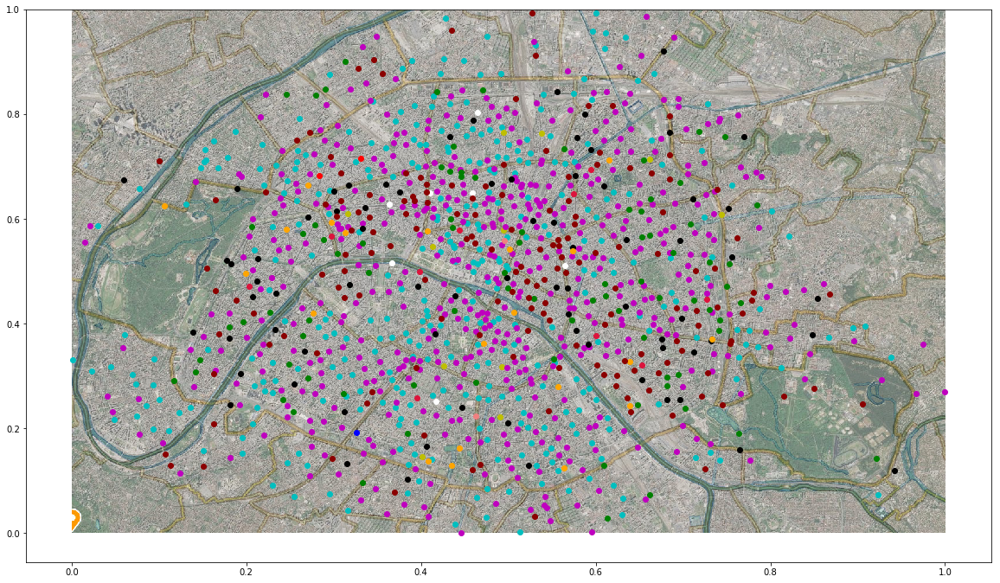

Qualité du clustering :  0.796838395213


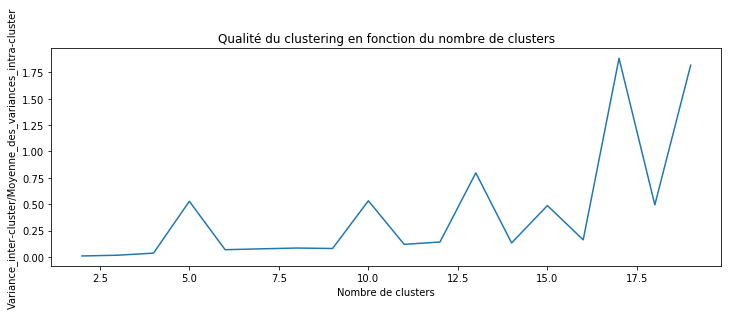

In [38]:
take=question_28(False) #matrice des emprunts/minute pour chaque station
(nb_stations,times)=np.shape(take)

def getkey2(item):
    #Clé de tri pour ordonner les stations : selon leur demande agrégée sur tout [0,times]
    return np.sum(item[2:(2+times)])

def question_31(N_clusters,dt,affiche):
    #on cherche à former des clusters de stations regroupées selon leur demande
    #par unité de temps en Vélib (choix de la distance -> voir commentaires)
    #à l'aide des données de 0 à dt (en minutes)
    #N_clusters : nombre de clusters souhaités
    #if affiche=True, on affiche la carte des clusters
    #if affiche=False, on se contente de retourner l'évaluation du clustering
    sigma=0.01

    #Initialisation : choix des clusters initiaux
    #On trie les stations par leur demande agrégée sur tout [0,times]
    data=np.concatenate((geo_data[:,0:2],take),axis=1)
    tmp=sorted(data,key=getkey2)
    data=np.vstack(tmp)

    #Clusters est un dico qui à un cluster nommé k associe une liste comprenant :
    #en premier terme : les index des stations qui s'y rattachent
    #en second terme : la demande du barycentre des demandes du cluster
    clusters=dict()
    for k in range(N_clusters): #choix des clusters initiaux
        idx_cluster=int(k*nb_stations/N_clusters)
        clusters[k]=[[idx_cluster],data[idx_cluster,:dt]]

    #sauvegarde des anciens barycentres pour condition d'arrêt de la boucle
    former_barycenters=np.array([cl[1] for cl in clusters.values()])
    #demandes des nouveaux barycentres que l'on va calculer
    new_barycenters=np.array([np.zeros((1,dt)) for k in range(N_clusters)])

    while(mse(former_barycenters,new_barycenters)!=0):
        #quand on sort de la boucle, les clusters ont été stabilisés

        for k in range(N_clusters):
            clusters[k][0]=[]

        #1. Expectation : affectation des stations aux clusters de barycentres les plus proches
        #(et calcul au fur et à mesure des nouveaux barycentres dans un tableau externe)

        new_barycenters=np.array([np.zeros((1,dt)) for k in range(N_clusters)]) #demandes des nouveaux barycentres
        nb_points=np.zeros((N_clusters,1)) #nombre de stations par cluster

        for i in range(nb_stations): #affectation de chaque station
           k=np.argmin(np.array([mse(take[i,:dt],clusters[p][1]) for p in range(N_clusters)]))
           nb_points[k]+=1 #1 station de plus dans le cluster
           clusters[k][0].append(i)
           new_barycenters[k,:]+=take[i,:dt]

        for k in range(N_clusters):
            if nb_points[k]!=0:
                new_barycenters[k,:]=new_barycenters[k,:]/nb_points[k]
            else:
                new_barycenters[k,:]=np.zeros((1,dt))

        #2. Maximisation : mise à jour des barycentres des nouveaux clusters formés

        #sauvegarde des anciens barycentres pour condition d'arrêt de la boucle
        former_barycenters=np.array([cl[1] for cl in clusters.values()])

        for k in range(N_clusters):
            clusters[k][1]=new_barycenters[k,:]

    if affiche:
        #Visualisation des clusters finaux (stabilisés)
        plt.figure(figsize=(20,20*0.6))
        show_map()
        c=["c", "y", "r", "c", "b", "m", "g", "k", "w","crimson","orange","lightcoral","darkred","deeppink"]
        print("Compositions des clusters : ")
        for k in range(N_clusters):
            print("Nombre de stations appartenant au cluster ",k," : ",len(clusters[k][0]))
            for idx_station in clusters[k][0]:
                pos_station=geo_data[idx_station,:2]
                plt.scatter(pos_station[0],pos_station[1],color=c[k])
        plt.show()

    #Evaluation de la qualité du clustering : variance inter-classe/mean(variance intra-classe)
    
    list_var_intra=[] #liste des variances intra-classe des clusters
    for k in range(N_clusters):
        #calcul des distance des demandes des stations du cluster à la demande du barycentre
        dist_bar=np.array([mse(take[i,:dt],np.array(clusters[k][1])) for i in clusters[k][0]])
        #la variance intra-classe correspond à la norme2 de ce vecteur des distances divisé par le nombre de stations
        list_var_intra.append(np.linalg.norm(dist_bar)/math.sqrt(len(clusters[k][0])))
    moy_var_intra=np.mean(np.array(list_var_intra))  #moyenne des variances intra-classe des clusters
    
    mean_bar=np.mean(np.array([np.array(clusters[k][1]) for k in range(N_clusters)]),axis=0) 
    #demande moyenne des demandes des barycentres des clusters
    list_dist_bar=[np.array(mse(np.array(clusters[k][1]),mean_bar)) for k in range(N_clusters)]
    #liste des distances des demandes des barycentres des clusters à cette demande moyenne
    var_inter=np.linalg.norm(list_dist_bar)/math.sqrt(N_clusters)

    if affiche:
        print("Qualité du clustering : ",var_inter/moy_var_intra)
    return var_inter/moy_var_intra

day=24*60 #clustering à partir des demandes des stations sur le premier jour

#Affichage du clustering pour 13 clusters
question_31(13,day,True) 

#Courbe donnant la qualité du clustering en fonction du nombre de clusters
N_clusters=list(range(2,20))
plt.plot(N_clusters,[question_31(N,day,False) for N in N_clusters])
plt.xlabel("Nombre de clusters")
plt.ylabel("Variance_inter-cluster/Moyenne_des_variances_intra-cluster")
plt.title("Qualité du clustering en fonction du nombre de clusters")
plt.show()

# Question 3.1

-  i) Quelle distance ?

Afin d'opérer un clustering des stations en prenant comme description la demande en vélib par unité de temps, on peut considérer comme distance station-cluster la somme des carrés des différences des demandes à chaque instant entre le barycentre du cluster et la station.

-  ii) Protocole expérimental de clustering

Supposons que nous souhaitions répartir les stations en 5 clusters.
Pour initialiser les clusters, on peut par exemple trier les stations par leur demande agrégée totale et choisir les stations correspondant aux quintiles de cette liste triée.

Ensuite, on applique l'algorithme EM (Expectation-Maximization):
- Expectation : on calcule les barycentres des clusters, qui correspondent aux demandes moyennes instant par instant des stations les constituant.
- Maximization : on attribue chaque station au cluster qui minimise la distance à son barycentre, comme définie précedemment.

On effectue ces deux étapes tant que les clusters ne sont pas stabilisés, ou encore jusqu'à ce que leurs barycentres ne bougent plus d'une itération à la suivante de l'algorithme EM. 

-  iii) Evaluation de la qualité d'un clustering

Pour obtenir un bon clustering, il faut que la variance inter-clusters soit la plus grande possible et que les variances intra-cluster soient les plus faibles possibles.

Par conséquent, on peut évaluer la qualité du clustering en calculant le quotient entre la variance inter-clusters et la moyenne des variances intra-cluster, en prenant toujours comme distance le carré de la distance euclidienne sur les demandes instant par instant (entre le barycentre et une station du cluster, ou entre les barycentres de deux clusters). Un bon clustering doit donc maximiser ce rapport.

Ce rapport se calcule donc de la manière suivante :
$$ Qualité = \frac { \frac{1}{\sqrt{N_{clusters}}}  \sqrt{ \sum_{C_k clusters} d \left( barycentre_{C_k}, \frac{1}{N_{clusters}}\sum_{C_k clusters} barycentre_{C_k} \right)^2 } } { \frac{1}{N_{clusters}} \sum_{C_k clusters} \frac{1}{\sqrt{N_{stations \in C_k}}} \sqrt {\sum_{station \in C_k} d(barycentre_{C_k},station)^2 } } $$

où d est la distance précédemment décrite, soit la distance euclidienne sur les vecteurs de demandes instant par instant 

-  iv) Commentaires sur les résultats

On trace l'évolution de ce rapport en fonction du nombre de clusters. On remarque que la qualité du clustering fluctue beaucoup d'une valeur à une autre : par exemple, 16 clusters donne un résultat catastrophique quant 17 clusters en donne un excellent.

On représente par exemple le clustering pour 13 clusters qui semble de bonne qualité, en associant une même couleur à toutes les stations d'un cluster.